In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
from typing import Tuple
import torchvision.models as models
import torchvision.transforms as T
import numpy as np
import os

print("Cuda available :", torch.cuda.is_available())
print("cuda version : ", torch.backends.cudnn.version())
print("No of GPU : ", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    print(f"Device {i} Name: ", torch.cuda.get_device_name(i))

Cuda available : True
cuda version :  8907
No of GPU :  1
Device 0 Name:  NVIDIA GeForce GTX 1650 with Max-Q Design


In [2]:
# Get image inputs and preprocess
def preprocess_images(image_path1: str, image_path2: str, height_width: int = 256) -> Tuple[torch.Tensor, torch.Tensor]:
    transform = transforms.Compose([
        transforms.Resize((height_width, height_width)),
        transforms.ToTensor()
    ])
    image1 = Image.open(image_path1).convert("RGB")
    image2 = Image.open(image_path2).convert("RGB")
    # print("Shape of Image 1: ", image1.size)
    # print("Shape of Image 2: ", image2.size)
    image1 = transform(image1)
    image2 = transform(image2)
    # print("Shape of Reshaped Image 1: ", image1.shape)
    # print("Shape of Reshaped Image 2: ", image2.shape)
    return image1, image2

def show_image(image: torch.Tensor) -> None:
    image_np = image.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    plt.imshow(image_np)
    plt.axis('off')

# Define a function to display an image on a given axis
def plot_image(ax, image: torch.Tensor, title: str):
    image_np = image.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')


In [3]:
def calculate_mean_pixel_difference(image1: torch.Tensor, image2: torch.Tensor, absolute: bool = True) -> float:
    if image1.shape != image2.shape:
        raise ValueError("Error: Tensors must have the same shape.")
    difference = image1 - image2
    if absolute:
        mean_difference = torch.mean(torch.abs(difference))
    else:
        mean_difference = torch.mean(difference ** 2)
    return mean_difference.item()  

In [4]:
### PIXEL WISE Fusing

# Function to combine images pixel-wise with alternating pattern
def combine_images_pixel_wise(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    combined_image_pixel_wise = torch.zeros_like(img1)
    combined_image_pixel_wise[:, 0::2, ::2] = img1[:, 0::2, ::2]    # img1 even rows, even cols
    combined_image_pixel_wise[:, 0::2, 1::2] = img2[:, 0::2, 1::2]  # img2 even rows, odd cols
    combined_image_pixel_wise[:, 1::2, ::2] = img2[:, 1::2, ::2]    # img2 odd rows, even cols
    combined_image_pixel_wise[:, 1::2, 1::2] = img1[:, 1::2, 1::2]  # img1 odd rows, odd cols
    return combined_image_pixel_wise

# Function to reconstruct images from combined image
def reconstruct_images_pixel_wise(combined_image_pixel_wise: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    img1_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img2_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img1_reconstructed_pixel_wise[:, 0::2, ::2] = combined_image_pixel_wise[:, 0::2, ::2]
    img2_reconstructed_pixel_wise[:, 0::2, 1::2] = combined_image_pixel_wise[:, 0::2, 1::2]
    img2_reconstructed_pixel_wise[:, 1::2, ::2] = combined_image_pixel_wise[:, 1::2, ::2]
    img1_reconstructed_pixel_wise[:, 1::2, 1::2] = combined_image_pixel_wise[:, 1::2, 1::2]
    return img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise

In [5]:
# 4NN Refinement
def replace_missing_pixels_with_neighbors(image_tensor: torch.Tensor, secret_image_number: int) -> torch.Tensor:
    channels, height, width = image_tensor.shape
    filled_image = image_tensor.clone()
    for i in range(height):
        for j in range(width):
            if secret_image_number == 1:
                if (i % 2 == 0 and j % 2 == 0) or (i % 2 == 1 and j % 2 == 1):
                    continue  
            elif secret_image_number == 2:
                if (i % 2 == 0 and j % 2 == 1) or (i % 2 == 1 and j % 2 == 0):
                    continue  
            if torch.all(filled_image[:, i, j] == 0):
                neighbors = []
                if i - 1 >= 0 and torch.any(filled_image[:, i - 1, j] != 0):
                    neighbors.append(filled_image[:, i - 1, j])
                if i + 1 < height and torch.any(filled_image[:, i + 1, j] != 0):
                    neighbors.append(filled_image[:, i + 1, j])
                if j - 1 >= 0 and torch.any(filled_image[:, i, j - 1] != 0):
                    neighbors.append(filled_image[:, i, j - 1])
                if j + 1 < width and torch.any(filled_image[:, i, j + 1] != 0):
                    neighbors.append(filled_image[:, i, j + 1])
                if neighbors:
                    filled_image[:, i, j] = torch.mean(torch.stack(neighbors), dim=0)
    return filled_image

In [6]:
### PIXEL WISE WITH MSB TECHNIQUE

# Function to load and preprocess images
def load_image_msb(image_path: str, size=(256, 256)) -> torch.Tensor:
    image = Image.open(image_path).convert("RGB")  
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),  
    ])
    image_tensor = transform(image) * 255  
    return image_tensor.to(torch.uint8)

# Function to display an image
def plot_image_msb(ax, image: torch.Tensor, title: str):
    image_np = image.permute(1, 2, 0).byte().numpy()  
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')  

# Combining images using MSB
def combine_images_pixel_wise_msb(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    img1 = img1.to(torch.uint8)
    img2 = img2.to(torch.uint8)
    combined_image_pixel_wise = torch.zeros_like(img1)
    img1_msb = img1 & 0xF0  
    img2_msb = img2 & 0xF0 
    combined_image_pixel_wise[:, ::2, ::2] = (img1_msb[:, ::2, ::2] | (img2_msb[:, ::2, ::2] >> 4))      # even row, even col
    combined_image_pixel_wise[:, ::2, 1::2] = (img2_msb[:, ::2, 1::2] | (img1_msb[:, ::2, 1::2] >> 4))   # even row, odd col
    combined_image_pixel_wise[:, 1::2, ::2] = (img2_msb[:, 1::2, ::2] | (img1_msb[:, 1::2, ::2] >> 4))   # odd row, even col
    combined_image_pixel_wise[:, 1::2, 1::2] = (img1_msb[:, 1::2, 1::2] | (img2_msb[:, 1::2, 1::2] >> 4))# odd row, odd col
    return combined_image_pixel_wise

# Reconstructing images from combined image
def reconstruct_images_pixel_wise_msb(combined_image_pixel_wise: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    combined_image_pixel_wise = combined_image_pixel_wise.to(torch.uint8)
    img1_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img2_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img1_reconstructed_pixel_wise[:, ::2, ::2] = combined_image_pixel_wise[:, ::2, ::2] & 0xF0             # even row, even col
    img2_reconstructed_pixel_wise[:, ::2, ::2] = (combined_image_pixel_wise[:, ::2, ::2] & 0x0F) << 4      # even row, even col
    img2_reconstructed_pixel_wise[:, ::2, 1::2] = combined_image_pixel_wise[:, ::2, 1::2] & 0xF0           # even row, odd col
    img1_reconstructed_pixel_wise[:, ::2, 1::2] = (combined_image_pixel_wise[:, ::2, 1::2] & 0x0F) << 4    # even row, odd col
    img2_reconstructed_pixel_wise[:, 1::2, ::2] = combined_image_pixel_wise[:, 1::2, ::2] & 0xF0           # odd row, even col
    img1_reconstructed_pixel_wise[:, 1::2, ::2] = (combined_image_pixel_wise[:, 1::2, ::2] & 0x0F) << 4    # odd row, even col
    img1_reconstructed_pixel_wise[:, 1::2, 1::2] = combined_image_pixel_wise[:, 1::2, 1::2] & 0xF0         # odd row, odd col
    img2_reconstructed_pixel_wise[:, 1::2, 1::2] = (combined_image_pixel_wise[:, 1::2, 1::2] & 0x0F) << 4  # odd row, odd col
    return img1_reconstructed_pixel_wise.to(torch.float32) / 255.0, img2_reconstructed_pixel_wise.to(torch.float32) / 255.0

In [7]:
arnold_const = 2
#Arnold and Revers Arnold
def arnold_transform_tensor(image_tensor: torch.Tensor, iterations: int = 1) -> torch.Tensor:
    N = image_tensor.shape[1]  
    transformed_image = image_tensor.clone()
    for _ in range(iterations):
        new_image = torch.zeros_like(transformed_image)
        for x in range(N):
            for y in range(N):
                x_new = (x + y) % N
                y_new = (x + arnold_const * y) % N
                new_image[:, x_new, y_new] = transformed_image[:, x, y]
        transformed_image = new_image.clone()
    return transformed_image

def reverse_arnold_transform_tensor(image_tensor: torch.Tensor, iterations: int = 1) -> torch.Tensor:
    N = image_tensor.shape[1]  
    transformed_image = image_tensor.clone()
    for _ in range(iterations):
        new_image = torch.zeros_like(transformed_image)
        for x in range(N):
            for y in range(N):
                x_new = (arnold_const * x - y) % N
                y_new = (-x + y) % N
                new_image[:, x_new, y_new] = transformed_image[:, x, y]
        transformed_image = new_image.clone()
    return transformed_image

In [8]:
image_path1 = './original_images/fuse1.JPEG'
image_path2 = './original_images/fuse2.JPEG'

img1, img2 = preprocess_images(image_path1, image_path2)
combined_image_pixel_wise = combine_images_pixel_wise(img1, img2)
scrambled_4nn = arnold_transform_tensor(combined_image_pixel_wise,8)
descrambled_4nn = reverse_arnold_transform_tensor(scrambled_4nn,8)
img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise = reconstruct_images_pixel_wise(combined_image_pixel_wise)
print(img1_reconstructed_pixel_wise.shape, img1_reconstructed_pixel_wise.dtype)
img1_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img1_reconstructed_pixel_wise, 1)
img2_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img2_reconstructed_pixel_wise, 2)


img1_msb = load_image_msb(image_path1)
img2_msb = load_image_msb(image_path2)
fused_image_msb = combine_images_pixel_wise_msb(img1_msb, img2_msb)
scrambled_lsb = arnold_transform_tensor(fused_image_msb,8)
descrambled_lsb = reverse_arnold_transform_tensor(scrambled_lsb,8)
img1_reconstructed_msb, img2_reconstructed_msb = reconstruct_images_pixel_wise_msb(descrambled_lsb)


torch.Size([3, 256, 256]) torch.float32


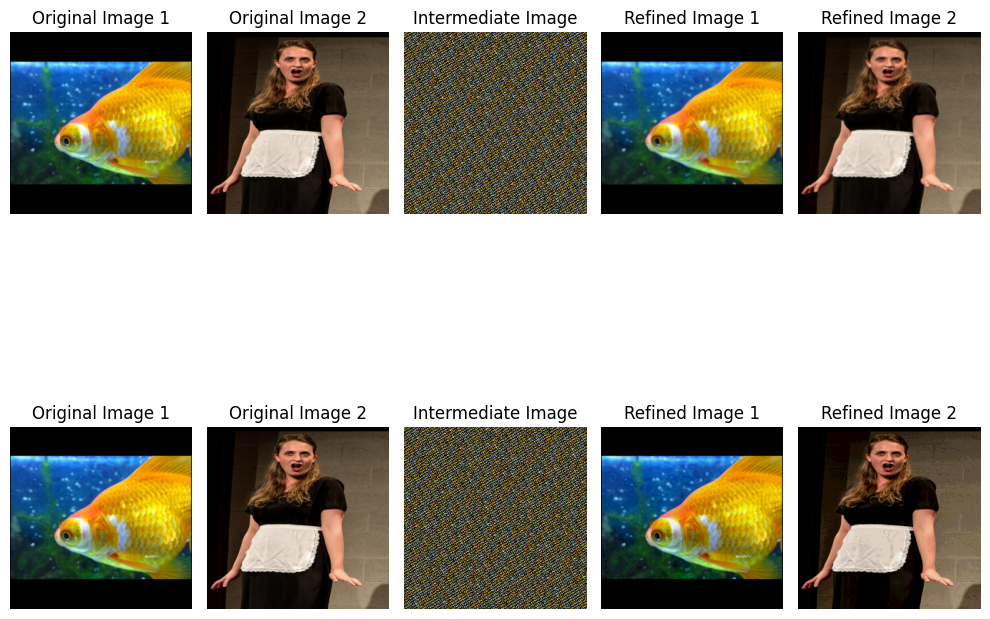

In [9]:
fig, axes = plt.subplots(2, 5, figsize=(10, 10))

plot_image(axes[0][0], img1, "Original Image 1")
plot_image(axes[0][1], img2, "Original Image 2")
plot_image(axes[0][2], scrambled_4nn, "Intermediate Image")
plot_image(axes[0][3], img1_NN_refined_pixel_wise, "Refined Image 1")
plot_image(axes[0][4], img2_NN_refined_pixel_wise, "Refined Image 2")

plot_image(axes[1][0], img1, "Original Image 1")
plot_image(axes[1][1], img2, "Original Image 2")
plot_image(axes[1][2], scrambled_lsb, "Intermediate Image")
plot_image(axes[1][3], img1_reconstructed_msb, "Refined Image 1")
plot_image(axes[1][4], img2_reconstructed_msb, "Refined Image 2")


# Hide the empty subplots
for ax in axes.flat:
    if not ax.has_data():
        ax.axis('off')  # Turn off the axis

plt.tight_layout()
plt.show()

In [10]:
image_dir = './original_images'
image_pairs = [("fuse1.JPEG", "ILSVRC2017_test_00000118.JPEG"), 
               ("ILSVRC2017_test_00000025.JPEG", "fuse2.JPEG"),
               ("ILSVRC2017_test_00000101.JPEG", "ILSVRC2017_test_00000034.JPEG"),
               ("ILSVRC2017_test_00000455.JPEG", "ILSVRC2017_test_00000130.JPEG"),
               ("ILSVRC2017_test_00000250.JPEG", "ILSVRC2017_test_00000101.JPEG")]

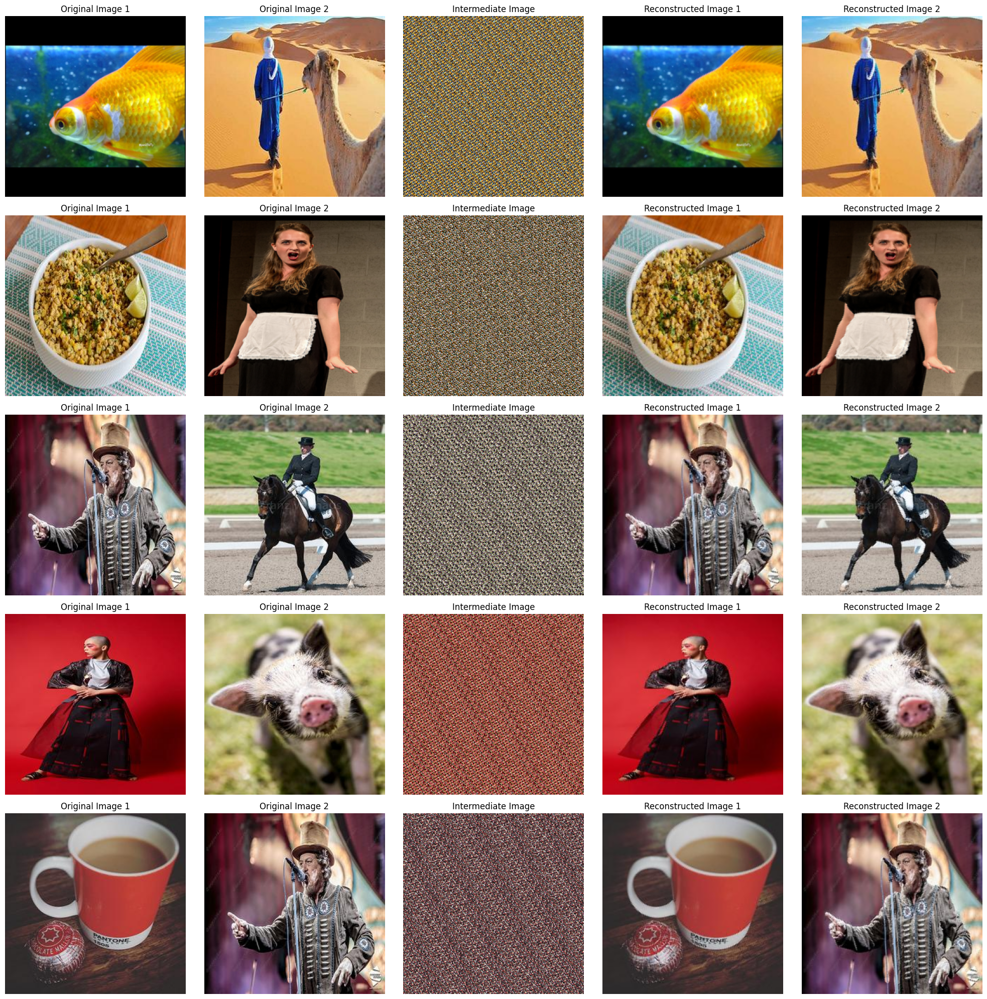

In [11]:
fig, axes = plt.subplots(len(image_pairs), 5, figsize=(20, len(image_pairs) * 4))

for idx, (image_name1, image_name2) in enumerate(image_pairs):
    image_path1 = os.path.join(image_dir, image_name1)
    image_path2 = os.path.join(image_dir, image_name2)
    
    img1, img2 = preprocess_images(image_path1, image_path2)
    combined_image_pixel_wise = combine_images_pixel_wise(img1, img2)
    scrambled_4nn = arnold_transform_tensor(combined_image_pixel_wise, 8)
    descrambled_4nn = reverse_arnold_transform_tensor(scrambled_4nn, 8)
    img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise = reconstruct_images_pixel_wise(descrambled_4nn)
    img1_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img1_reconstructed_pixel_wise, 1)
    img2_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img2_reconstructed_pixel_wise, 2)
    
    plot_image(axes[idx, 0], img1, f"Original Image 1")
    plot_image(axes[idx, 1], img2, f"Original Image 2")
    plot_image(axes[idx, 2], scrambled_4nn, "Intermediate Image")
    plot_image(axes[idx, 3], img1_NN_refined_pixel_wise, "Reconstructed Image 1")
    plot_image(axes[idx, 4], img2_NN_refined_pixel_wise, "Reconstructed Image 2")

plt.tight_layout()
plt.show()

In [12]:
from torchvision.utils import save_image

image_path1 = './original_images/ILSVRC2017_test_00000101.JPEG'
image_path2 = './original_images/ILSVRC2017_test_00000455.JPEG'
img1, img2 = preprocess_images(image_path1, image_path2)
combined_image_pixel_wise = combine_images_pixel_wise(img1, img2)
scrambled_4nn = arnold_transform_tensor(combined_image_pixel_wise, 8)
descrambled_4nn = reverse_arnold_transform_tensor(scrambled_4nn, 8)
img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise = reconstruct_images_pixel_wise(descrambled_4nn)

img1_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img1_reconstructed_pixel_wise, 1)
img2_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img2_reconstructed_pixel_wise, 2)
save_image(scrambled_4nn, f"PresentationSavedImages/scrambled.png")


68.7269515991211
145.4989471435547
136.15357971191406
70.42806243896484
98.83450317382812
129.2368927001953
66.30072021484375
134.6494903564453
86.25503540039062
98.83450317382812


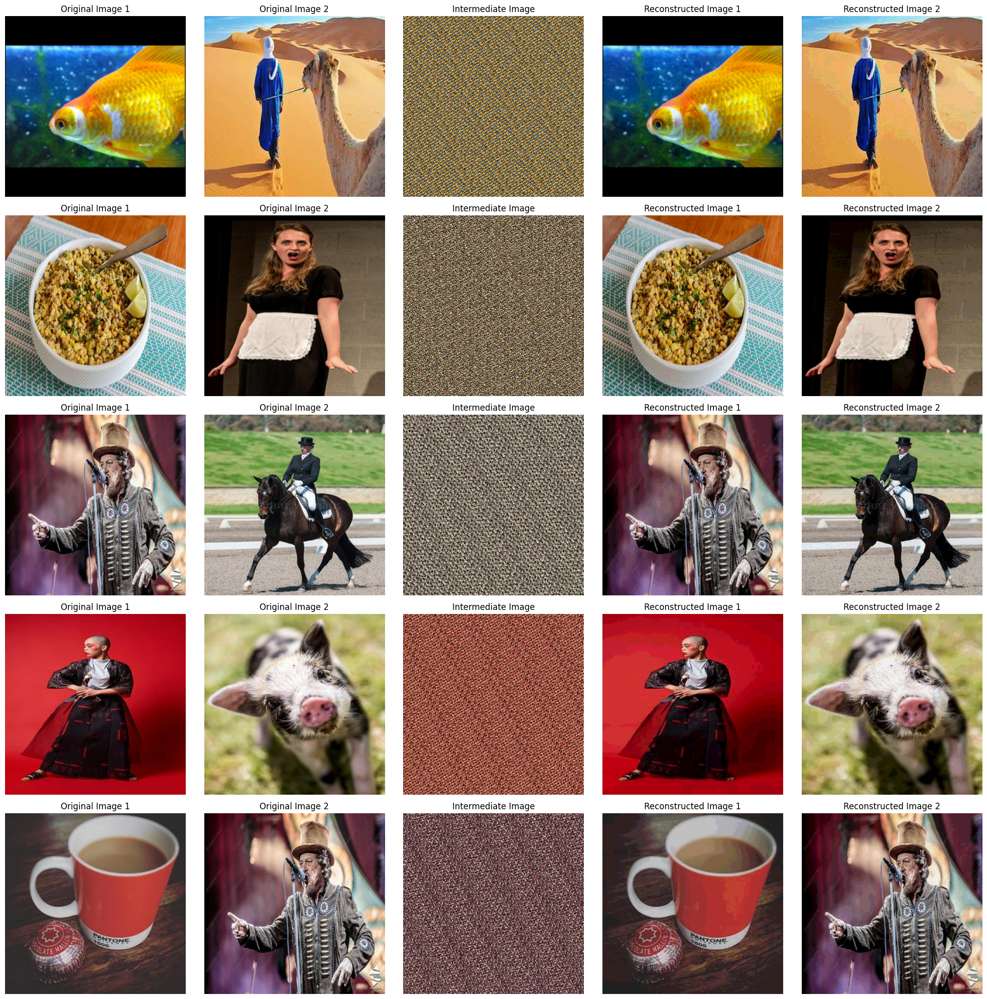

In [13]:
fig, axes = plt.subplots(len(image_pairs), 5, figsize=(20, len(image_pairs) * 4))

for idx, (image_name1, image_name2) in enumerate(image_pairs):
    image_path1 = os.path.join(image_dir, image_name1)
    image_path2 = os.path.join(image_dir, image_name2)
    
    img1_msb = load_image_msb(image_path1)
    img2_msb = load_image_msb(image_path2)
    fused_image_msb = combine_images_pixel_wise_msb(img1_msb, img2_msb)
    scrambled_lsb = arnold_transform_tensor(fused_image_msb,8)
    descrambled_lsb = reverse_arnold_transform_tensor(scrambled_lsb,8)
    img1_reconstructed_msb, img2_reconstructed_msb = reconstruct_images_pixel_wise_msb(descrambled_lsb)

    img1_diff = calculate_mean_pixel_difference(img1_msb, img1_reconstructed_msb)
    img2_diff = calculate_mean_pixel_difference(img2_msb, img2_reconstructed_msb)
    print(img1_diff)
    print(img2_diff)

    plot_image(axes[idx, 0], img1_msb, f"Original Image 1")
    plot_image(axes[idx, 1], img2_msb, f"Original Image 2")
    plot_image(axes[idx, 2], scrambled_lsb, "Intermediate Image")
    plot_image(axes[idx, 3], img1_reconstructed_msb, "Reconstructed Image 1")
    plot_image(axes[idx, 4], img2_reconstructed_msb, "Reconstructed Image 2")

plt.tight_layout()
plt.show()

In [14]:
# import os
# from itertools import combinations
# from torchvision.utils import save_image

# # Directories
# image_dir = './test_image'
# output_dir_lsb = './scrambled_lsb'
# output_dir_4nn = './scrambled_4nn'

# # Create output directories if they don't exist
# os.makedirs(output_dir_lsb, exist_ok=True)
# os.makedirs(output_dir_4nn, exist_ok=True)

# # Helper function to get all image file paths from the directory
# def get_image_file_paths(directory):
#     allowed_extensions = ('.png', '.jpg', '.jpeg', '.JPEG')
#     return [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(allowed_extensions)]

# # Get all images in the directory and form pairs
# image_paths = get_image_file_paths(image_dir)
# image_pairs = list(combinations(image_paths, 2))  # Form all unique pairs

# print(f"Found {len(image_pairs)} image pairs in the directory.")

# # Loop through the image pairs and process
# for idx, (image_path1, image_path2) in enumerate(image_pairs):
#     # Load and preprocess images
#     img1, img2 = preprocess_images(image_path1, image_path2)
#     combined_image_pixel_wise = combine_images_pixel_wise(img1, img2)
    
#     # Apply Arnold transforms (scramble images)
#     scrambled_4nn = arnold_transform_tensor(combined_image_pixel_wise, 8)
#     scrambled_lsb = arnold_transform_tensor(combined_image_pixel_wise, 8)  # Adjust if needed for LSB scrambling
    
#     # Generate output file names
#     basename1 = os.path.basename(image_path1).split('.')[0]
#     basename2 = os.path.basename(image_path2).split('.')[0]
#     scrambled_4nn_path = os.path.join(output_dir_4nn, f"{basename1}_{basename2}_4nn.png")
#     scrambled_lsb_path = os.path.join(output_dir_lsb, f"{basename1}_{basename2}_lsb.png")
    
#     # Save the scrambled images
#     save_image(scrambled_4nn, scrambled_4nn_path)
#     save_image(scrambled_lsb, scrambled_lsb_path)

# print(f"Scrambled images saved in '{output_dir_4nn}' and '{output_dir_lsb}'.")
